In [4]:
%run geo_libraries/util_functions.ipynb

Importing main Libraries
Importing Metrics
Importing Mape
Improting human_format
Importing PrecioSplitter
Importing ClippedTarget


In [1]:
import  geopandas as gpd

### Table of Content

**Last update:** 21-06-2020.

### Table of contents:
#### Inicio

* [Open Street Maps](#Open-Street-Maps)
    - [Looking-Cities](#Looking-Cities)
    - [Filtering routes of location](#Filtering-routes-of-location)

* [Geo Json](#Geo-Json)
    - [Locations Bogotá](#Locations-Bogotá)
    - [Location Blocks](#Location-Blocks)

# Open Street Maps
> OpenStreetMap is a collaborative project to create a free editable map of the world. The geodata underlying the map is considered the primary output of the project. 

### Looking Cities

C:\Users\VoxivaAI\AppData\Local\conda\conda\envs\deep_env\lib\site-packages\osmnx\plot.py:55: UserWarning: The fig_height, fig_width parameter(s) have been deprecated and will be removed in the next release. Note, fig_height and fig_width are replaced by the figsize parameter, use that instead. 
  warnings.warn(msg)


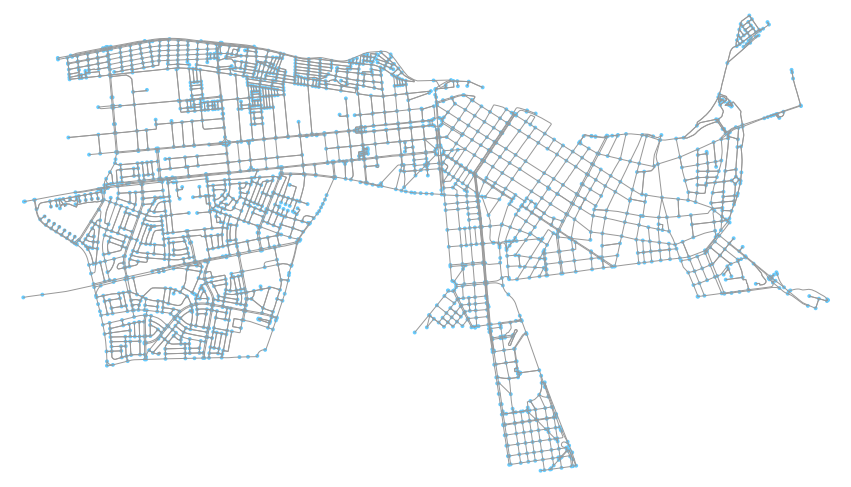

In [5]:
import osmnx as ox

G = ox.graph_from_place('Lima, Peru', network_type = 'drive')
fig, ax = ox.plot_graph(G, fig_width = 15, fig_height = 20)

C:\Users\VoxivaAI\AppData\Local\conda\conda\envs\deep_env\lib\site-packages\osmnx\plot.py:55: UserWarning: The fig_height, fig_width parameter(s) have been deprecated and will be removed in the next release. Note, fig_height and fig_width are replaced by the figsize parameter, use that instead. 
  warnings.warn(msg)


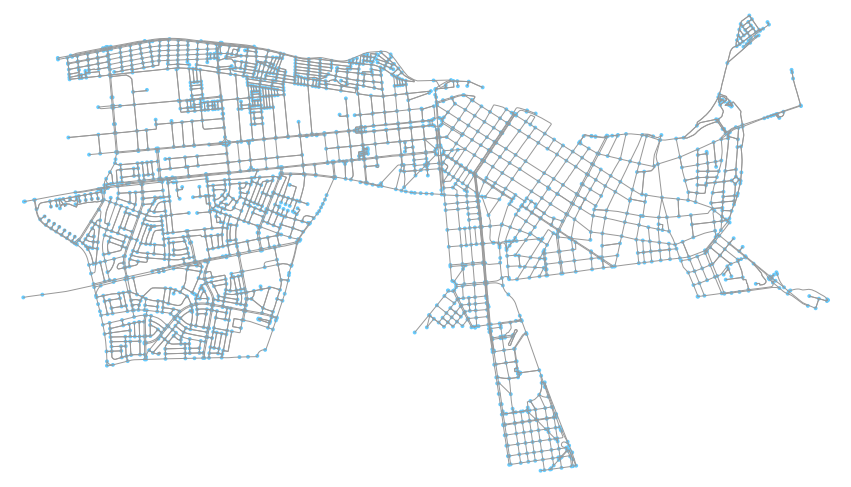

<Figure size 432x288 with 0 Axes>

In [13]:
import osmnx as ox

G_ = ox.graph_from_place('Lima, Perú', network_type = 'drive')
fig, ax = ox.plot_graph(G_, fig_width = 15, fig_height = 20)

plt.savefig("mapa_villa_savage.png", transparent = True)

In [14]:
nodes, streets = ox.graph_to_gdfs(G)

In [15]:
streets.head()

,osmid,name,highway,maxspeed,oneway,length,lanes,geometry,access,junction,ref,tunnel,service,bridge,u,v,key
0,111888580,Jirón Ricardo Rivera Navarrete,residential,30,False,60.413,NaN,"LINESTRING (-77.07898 -12.05385, -77.07928 -12...",NaN,NaN,NaN,NaN,NaN,NaN,1273610289,1475218848,0
1,420679867,Mariano Arredondo,tertiary,40,False,59.608,2,"LINESTRING (-77.07898 -12.05385, -77.07851 -12...",NaN,NaN,NaN,NaN,NaN,NaN,1273610289,1273734897,0
2,420679867,Mariano Arredondo,tertiary,40,False,49.814,2,"LINESTRING (-77.07898 -12.05385, -77.07936 -12...",NaN,NaN,NaN,NaN,NaN,NaN,1273610289,1397486926,0
3,111888580,Jirón Ricardo Rivera Navarrete,residential,30,False,80.844,NaN,"LINESTRING (-77.07898 -12.05385, -77.07877 -12...",NaN,NaN,NaN,NaN,NaN,NaN,1273610289,1397486923,0
4,149509214,Calle 11,residential,30,False,197.316,NaN,"LINESTRING (-77.07497 -12.05937, -77.07485 -12...",NaN,NaN,NaN,NaN,NaN,NaN,1624735795,1624735796,0


### Get map from point (latitud and longitud)

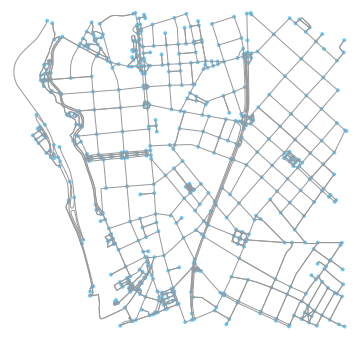

(<Figure size 468.587x432 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1681d3f76a0>)

In [16]:
G = ox.graph_from_point((-12.143959,-77.02026805535999), dist=750, network_type='all')
ox.plot_graph(G)

### Metrics of maps
- Network Analysis
- Filter main stablishments 
- Cross georeferencial, education and socieconomics data.

In [17]:
basic_stats = ox.basic_stats(G)
print(basic_stats['circuity_avg'])

extended_stats = ox.extended_stats(G)
print(extended_stats['pagerank_max_node'])

1.0501700169784915
5005619631


This could help us to have a deeper understanding of the most vulnerables areas, It would be getting better and better meanwhile we can describe with different types of inputs.

# Geo Json

### Locations Bogotá
> This dataset contains georeferencial variables

In [68]:
fname_loc = "https://datosabiertos.bogota.gov.co/dataset/856cb657-8ca3-4ee8-857f-37211173b1f8/resource/497b8756-0927-4aee-8da9-ca4e32ca3a8a/download/loca.geojson"
df_localidades = gpd.read_file(fname_loc)
print(type(df_localidades))

<class 'geopandas.geodataframe.GeoDataFrame'>


In [69]:
df_localidades.head()

,LocNombre,LocAAdmini,LocArea,LocCodigo,SHAPE_Leng,SHAPE_Area,geometry
0,ANTONIO NARIÑO,Acuerdo 117 de 2003,4879543.386,15,0.109,0.000,"MULTIPOLYGON (((-74.13075 4.59335, -74.12917 4..."
1,TUNJUELITO,Acuerdo 117 de 2003,9910939.744,06,0.211,0.001,"MULTIPOLYGON (((-74.13777 4.59489, -74.13165 4..."
2,RAFAEL URIBE URIBE,Acuerdo 117 de 2003,13834084.807,18,0.175,0.001,"MULTIPOLYGON (((-74.12803 4.59254, -74.12777 4..."
3,CANDELARIA,Acuerdo 117 de 2003,2060242.920,17,0.067,0.000,"MULTIPOLYGON (((-74.06621 4.60317, -74.06620 4..."
4,BARRIOS UNIDOS,Acuerdo 8 de 1977,11903448.205,12,0.121,0.001,"MULTIPOLYGON (((-74.05725 4.68684, -74.06249 4..."


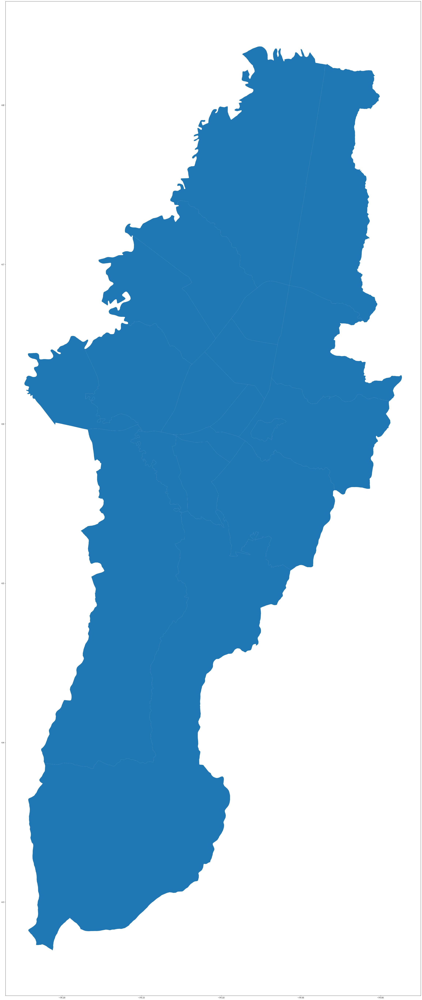

In [125]:
fig_loc, ax_loc = plt.subplots(1, 1, figsize = (100, 100))
df_localidades[df_localidades.LocNombre!= 'SUMAPAZ'].plot(ax = ax_loc)

In [91]:
df_localidades.head()

,LocNombre,LocAAdmini,LocArea,LocCodigo,SHAPE_Leng,SHAPE_Area,geometry
0,ANTONIO NARIÑO,Acuerdo 117 de 2003,4.879543e+06,15,0.108973,0.000397,"MULTIPOLYGON (((-74.13075 4.59335, -74.12917 4..."
1,TUNJUELITO,Acuerdo 117 de 2003,9.910940e+06,06,0.210542,0.000807,"MULTIPOLYGON (((-74.13777 4.59489, -74.13165 4..."
2,RAFAEL URIBE URIBE,Acuerdo 117 de 2003,1.383408e+07,18,0.174513,0.001126,"MULTIPOLYGON (((-74.12803 4.59254, -74.12777 4..."
3,CANDELARIA,Acuerdo 117 de 2003,2.060243e+06,17,0.067158,0.000168,"MULTIPOLYGON (((-74.06621 4.60317, -74.06620 4..."
4,BARRIOS UNIDOS,Acuerdo 8 de 1977,1.190345e+07,12,0.121180,0.000969,"MULTIPOLYGON (((-74.05725 4.68684, -74.06249 4..."


### Location Blocks 

In [72]:
import geopandas as gpd
fname = "https://datosabiertos.bogota.gov.co/dataset/dd5c2af8-caeb-4ec1-8f66-28a2bad8cec1/resource/3486d1d2-c1d8-449e-a31c-74872a87f960/download/manzanaestratificacion.geojson"
df = gpd.read_file(fname)
print(type(df))

In [52]:
df.to_file("manzanaestratificacion.geojson", driver='GeoJSON')

In [19]:
df = gpd.read_file("datos_abiertos/manzanaestratificacion.geojson")
df.head(2)

,CODIGO_MAN,ESTRATO,CODIGO_ZON,CODIGO_CRI,NORMATIVA,ACTO_ADMIN,NUMERO_ACT,FECHA_ACTO,ESCALA_CAP,FECHA_CAPT,RESPONSABL,SHAPE_Leng,SHAPE_Area,geometry
0,00913633,0,20,394,DEC394,DEC,394,2017-07-28,None,2017-07-28,560,2203.905,267773.514,"POLYGON ((-74.03556 4.82078, -74.03767 4.82167..."
1,108101A1,6,17,394,DEC394,DEC,394,2017-07-28,None,2017-07-28,560,6350.897,889000.150,"POLYGON ((-74.00643 4.81884, -74.00860 4.81886..."


In [76]:
df.ESTRATO.unique()

array([0, 6, 3, 2, 5, 1, 4], dtype=int64)

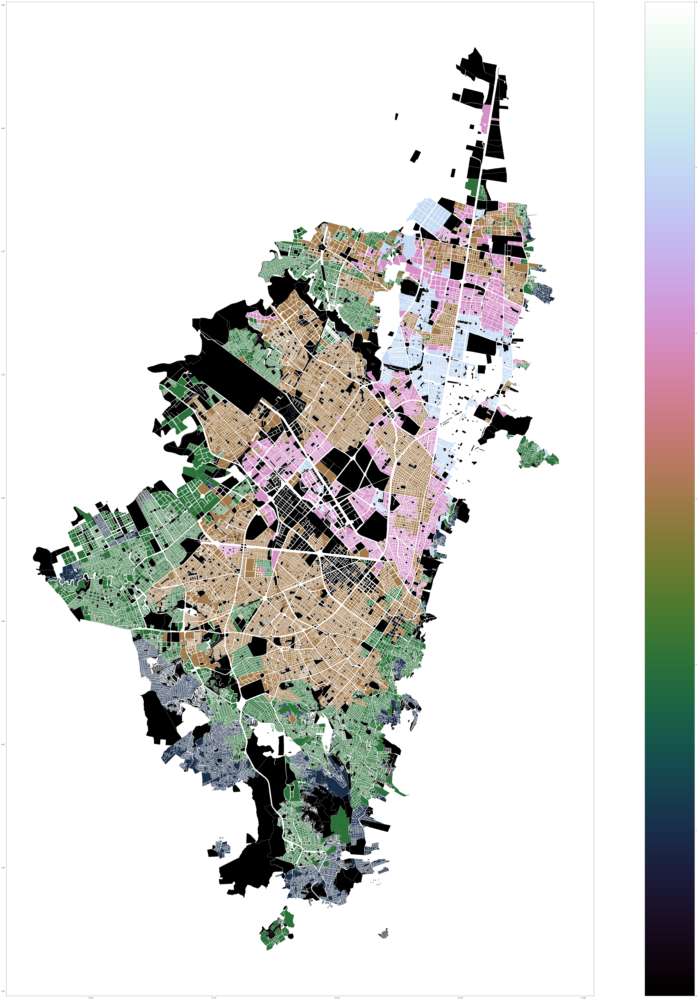

In [222]:
sns.set_style("white")

fig, ax_ = plt.subplots(1, 1, figsize = (100, 100))
df.plot(ax = ax_, column = 'ESTRATO', legend = True, cmap = 'cubehelix' )

---